In [1]:
import pandas as pd
import scipy.stats as stats
import pylab
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.decomposition import PCA
from sklearn import svm

In [2]:
#Part1
df=pd.read_csv('D:/UIUC/IE517 machine learning/week5/homework/hw5_treasury yield curve data.csv',index_col='Date')
TYCD=df.iloc[::-1]
TYCD.head()

,SVENF01,SVENF02,SVENF03,SVENF04,SVENF05,SVENF06,SVENF07,SVENF08,SVENF09,SVENF10,...,SVENF22,SVENF23,SVENF24,SVENF25,SVENF26,SVENF27,SVENF28,SVENF29,SVENF30,Adj_Close
Date,,,,,,,,,,,,,,,,,,,,,
1/13/1987,6.2102,6.6709,7.0310,7.3333,7.5890,7.8010,7.9722,8.1067,8.2099,8.2875,...,8.4822,8.4829,8.4834,8.4836,8.4838,8.4840,8.4841,8.4841,8.4841,2.942279
1/14/1987,6.2215,6.6978,7.0637,7.3688,7.6270,7.8421,8.0168,8.1551,8.2619,8.3428,...,8.5503,8.5511,8.5516,8.5519,8.5522,8.5523,8.5524,8.5525,8.5525,2.942279
1/15/1987,6.2195,6.6790,7.0240,7.3172,7.5738,7.7951,7.9805,8.1314,8.2507,8.3430,...,8.5936,8.5946,8.5953,8.5958,8.5961,8.5963,8.5965,8.5966,8.5966,2.942279
1/16/1987,6.2091,6.6589,6.9843,7.2634,7.5140,7.7355,7.9250,8.0814,8.2067,8.3044,...,8.5737,8.5748,8.5756,8.5761,8.5764,8.5767,8.5768,8.5769,8.5770,2.942279
1/20/1987,6.1632,6.6192,6.9560,7.2403,7.4888,7.7032,7.8831,8.0295,8.1454,8.2350,...,8.4777,8.4787,8.4794,8.4799,8.4802,8.4804,8.4805,8.4806,8.4807,2.942279


In [3]:
df.describe()

,SVENF01,SVENF02,SVENF03,SVENF04,SVENF05,SVENF06,SVENF07,SVENF08,SVENF09,SVENF10,...,SVENF22,SVENF23,SVENF24,SVENF25,SVENF26,SVENF27,SVENF28,SVENF29,SVENF30,Adj_Close
count,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,...,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000
mean,3.785311,4.258972,4.669363,5.022430,5.318493,5.559644,5.750071,5.895135,6.000596,6.072112,...,5.689046,5.621666,5.554136,5.486943,5.420479,5.355063,5.290948,5.228333,5.167371,5.509793
std,2.648060,2.498137,2.341348,2.221632,2.137801,2.080405,2.040337,2.010786,1.987244,1.966960,...,1.801291,1.797858,1.797012,1.798842,1.803390,1.810643,1.820541,1.832984,1.847834,2.491110
min,0.072700,0.327300,0.630300,1.013000,1.424500,1.698200,1.807300,1.885000,1.942100,1.988200,...,1.489600,1.283000,1.100800,0.941000,0.801800,0.681200,0.577100,0.487600,0.411100,2.801050
25%,1.144050,1.865600,2.536550,3.023050,3.544700,4.063300,4.409750,4.644300,4.774550,4.859500,...,4.177450,4.090550,4.024800,3.982950,3.962100,3.887150,3.840900,3.825050,3.831350,3.130587
50%,3.986500,4.393300,4.505500,4.718900,5.051300,5.394600,5.663700,5.870800,5.993700,6.082400,...,5.619600,5.503000,5.369900,5.228000,5.096700,4.979700,4.860800,4.758600,4.669000,4.956219
75%,5.901500,6.221250,6.461300,6.626600,6.779550,6.908050,7.049900,7.181600,7.297550,7.393350,...,7.330550,7.233200,7.114900,6.998150,6.871050,6.765400,6.650600,6.535450,6.421850,8.051437
max,9.813800,9.887800,10.145600,10.459900,10.649900,10.741400,10.766300,10.747500,10.701500,10.640000,...,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.150118


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8071 entries, 5/17/2019 to 1/13/1987
Data columns (total 31 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   SVENF01    8071 non-null   float64
 1   SVENF02    8071 non-null   float64
 2   SVENF03    8071 non-null   float64
 3   SVENF04    8071 non-null   float64
 4   SVENF05    8071 non-null   float64
 5   SVENF06    8071 non-null   float64
 6   SVENF07    8071 non-null   float64
 7   SVENF08    8071 non-null   float64
 8   SVENF09    8071 non-null   float64
 9   SVENF10    8071 non-null   float64
 10  SVENF11    8071 non-null   float64
 11  SVENF12    8071 non-null   float64
 12  SVENF13    8071 non-null   float64
 13  SVENF14    8071 non-null   float64
 14  SVENF15    8071 non-null   float64
 15  SVENF16    8071 non-null   float64
 16  SVENF17    8071 non-null   float64
 17  SVENF18    8071 non-null   float64
 18  SVENF19    8071 non-null   float64
 19  SVENF20    8071 non-null   float64
 20  

In [5]:
#show all the colums that have Nan
for i in df.columns:
    if'Nan'in df[i].tolist():
        print(i)
#result shows that there is no Nan in housing.csv

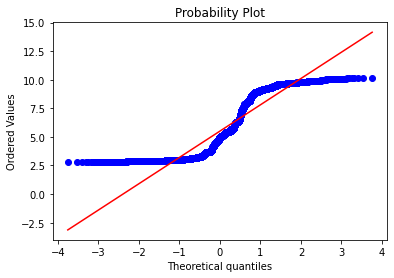

In [6]:
#No1 QQ plot
#Adj_close QQ Plot
stats.probplot(df['Adj_Close'],dist='norm',plot=pylab)
pylab.show()

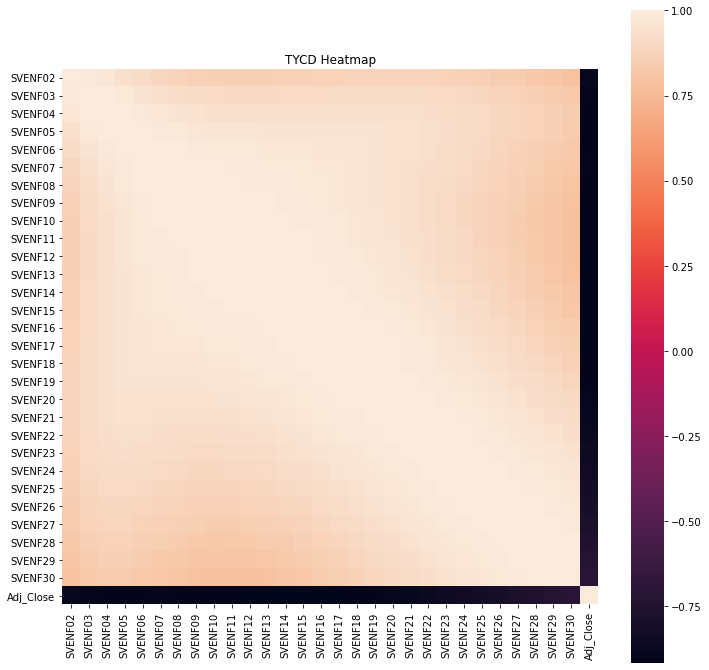

In [7]:
#No2 Heatmap
#solution 2
plt.figure(figsize=(12,12))
cm=np.corrcoef(TYCD.iloc[:,1:32].values.T)
hm = sns.heatmap(cm,cbar=True,square=True,fmt='.2f',annot=False,yticklabels=TYCD.columns[1:32],xticklabels=TYCD.columns[1:32],
                 annot_kws={'size': 15})
plt.title('TYCD Heatmap')
plt.show()

<Figure size 864x720 with 0 Axes>

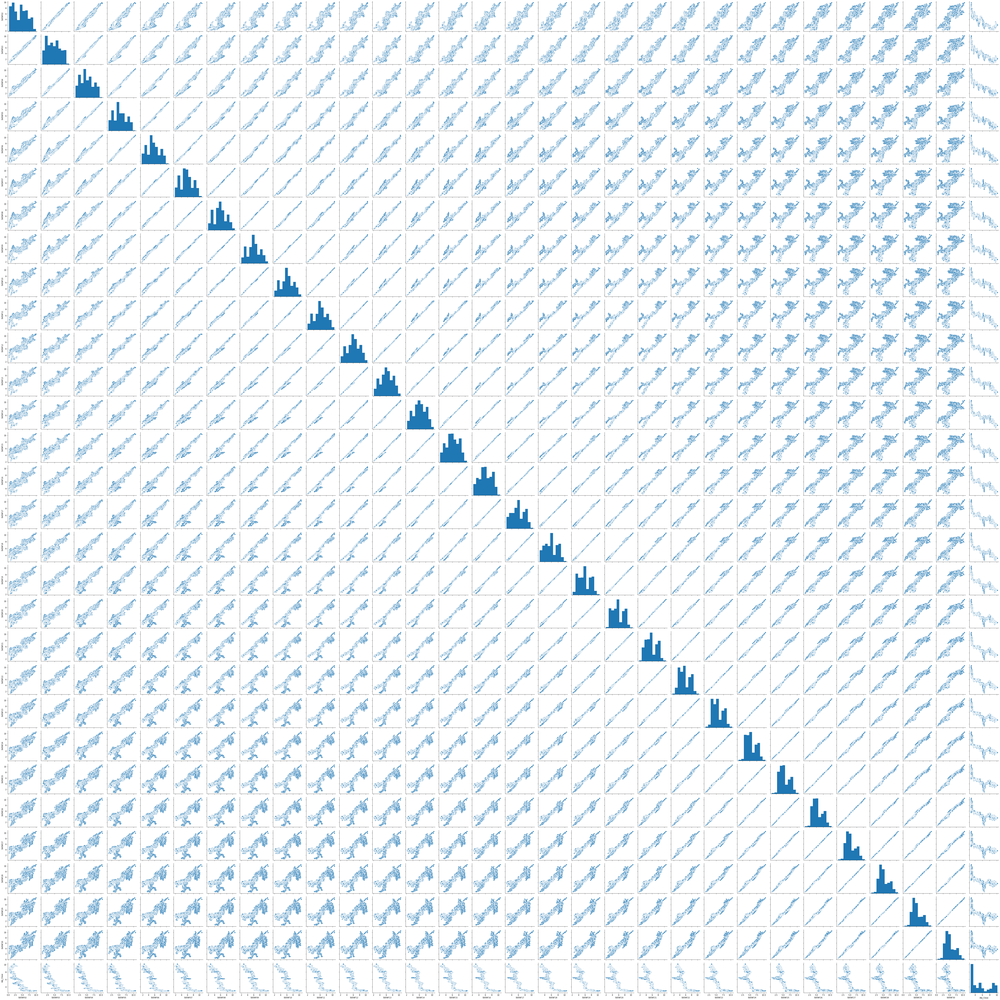

In [8]:
#NO3 Scatterplot
plt.figure(figsize=(12,10))
sns.pairplot(TYCD.iloc[:,1:32],height=2.5)
plt.tight_layout()
plt.show()

In [9]:
#Split train set and test set
X=TYCD.iloc[:, 0:30].values
y=TYCD.iloc[:,30].values
X_std = StandardScaler().fit_transform(X)
y_std = StandardScaler().fit_transform(y.reshape(-1,1))
                                       
X_train, X_test, y_train, y_test =  train_test_split(X_std, y_std, test_size=0.15, random_state=42)


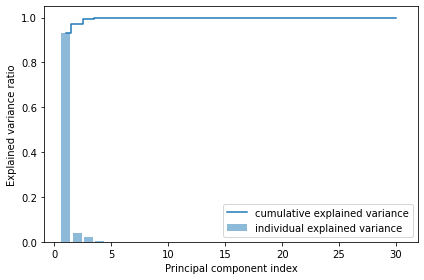

In [10]:
# Eigendecomposition of the covariance matrix.
cov_mat = np.cov(X_train.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)
#print('\nEigenvalues \n%s' % eigen_vals)

# Total and explained variance
tot = sum(eigen_vals)
var_exp =[ (i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
var_exp =np.array( [(i / tot) for i in sorted(eigen_vals, reverse=True)])

plt.bar(range(1, 31), var_exp, alpha=0.5, align='center',
        label='individual explained variance')
plt.step(range(1, 31), cum_var_exp, where='mid',
         label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [11]:
pca = PCA(n_components=3)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)
print("The cumulative explained variance of 3 pca features:")
print(pca.explained_variance_ratio_)

The cumulative explained variance of 3 pca features:
[0.93158185 0.04096821 0.02180102]


In [12]:
lin = LinearRegression()
lin.fit(X_train,y_train)
y_train_pred=lin.predict(X_train)
y_test_pred=lin.predict(X_test)

In [13]:
#MSE
print('MSE train: %.3f, test: %.3f' % (mean_squared_error(y_train, y_train_pred),mean_squared_error(y_test, y_test_pred)))

MSE train: 0.098, test: 0.094


In [14]:
#R2
print('R^2 train: %.3f, test: %.3f' % (r2_score(y_train, y_train_pred),r2_score(y_test, y_test_pred)))

R^2 train: 0.902, test: 0.904


In [15]:
sv = svm.SVR()
sv.fit(X_train,y_train)
y_train_pred=sv.predict(X_train)
y_test_pred=sv.predict(X_test)

C:\Users\zhangchenxiang\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


In [16]:
#MSE
print('MSE train: %.3f, test: %.3f' % (mean_squared_error(y_train, y_train_pred),mean_squared_error(y_test, y_test_pred)))

MSE train: 0.011, test: 0.010


In [17]:
#R2
print('R^2 train: %.3f, test: %.3f' % (r2_score(y_train, y_train_pred),r2_score(y_test, y_test_pred)))

R^2 train: 0.989, test: 0.990


In [18]:
#PCA,MSE&R2
lin = LinearRegression()
lin.fit(X_train_pca,y_train)
y_train_pred=lin.predict(X_train_pca)
y_test_pred=lin.predict(X_test_pca)
print('MSE train: %.3f, test: %.3f' % (mean_squared_error(y_train, y_train_pred),mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (r2_score(y_train, y_train_pred),r2_score(y_test, y_test_pred)))

MSE train: 0.133, test: 0.132
R^2 train: 0.867, test: 0.866


In [20]:
#PCA,MSE&R2
sv = svm.SVR()
sv.fit(X_train_pca,y_train)
y_train_pred=sv.predict(X_train_pca)
y_test_pred=sv.predict(X_test_pca)
print('MSE train: %.3f, test: %.3f' % (mean_squared_error(y_train, y_train_pred),mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (r2_score(y_train, y_train_pred),r2_score(y_test, y_test_pred)))

C:\Users\zhangchenxiang\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


MSE train: 0.021, test: 0.019
R^2 train: 0.979, test: 0.981


In [21]:
print("My name is chenxiang zhang")
print("My NetID is: cz52")
print("I hereby certify that I have read the University policy on Academic Integrity and that I am not in violation.")

My name is chenxiang zhang
My NetID is: cz52
I hereby certify that I have read the University policy on Academic Integrity and that I am not in violation.
